In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import h5py

import tensorflow as tf
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt

from time import time
from icecream import ic

from msfm.utils import tfrecords, files, parameters
from msfm.fiducial_pipeline import FiducialPipeline
from msfm.utils.input_output import read_yaml

23-08-22 14:55:23    scales.py INF   Setting up healpy to run on 8 CPUs 


In [3]:
data_vec_pix, _, _, _ = files.load_pixel_file()
n_side = 512
n_pix = hp.nside2npix(n_side)

23-08-22 14:55:24     files.py INF   Loaded the pixel file /cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 


# v4 of the pipeline (multiple poisson noise realizations)

In [4]:
n_pix = hp.nside2npix(512)
# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v4/debug/fiducial/DESy3_fiducial_000.tfrecord"
tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v4/debug/DESy3_fiducial_000.tfrecord"

noiseless_fid_pipe = FiducialPipeline(
    params=["Om", "s8", "Aia", "bg", "n_Aia", "n_bg"],
    with_lensing=True,
    with_clustering=True,
    with_padding=True,
    apply_norm=False,
    shape_noise_scale=0,
    poisson_noise_scale=0,    
)

noisy_fid_pipe = FiducialPipeline(
    params=["Om", "s8", "Aia", "bg", "n_Aia", "n_bg"],
    with_lensing=True,
    with_clustering=True,
    with_padding=True,
    apply_norm=False,
    shape_noise_scale=1.0,
    poisson_noise_scale=1.0,    
)

23-08-22 14:55:24     files.py INF   Loaded the pixel file /cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 
23-08-22 14:55:24     files.py INF   Loaded the pixel file /cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 
23-08-22 14:55:25     files.py INF   Loaded the pixel file /cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 
23-08-22 14:55:25     files.py INF   Loaded the pixel file /cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 


2023-08-22 14:55:25.511138: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [5]:
fiducial_dset = noiseless_fid_pipe.get_dset(
    tfr_pattern=tfr_pattern,
    local_batch_size=1,
    i_noise=0,
    n_readers=1,
    examples_shuffle_buffer=None,
    n_prefetch=0,
    is_eval=True,
)

# get a single batch
for data_vector, index in fiducial_dset.take(1):
    dv_noiseless = data_vector

dvs_noisy = []

for i_noise in range(3):
    fiducial_dset = noisy_fid_pipe.get_dset(
        tfr_pattern=tfr_pattern,
        local_batch_size=1,
        i_noise=i_noise,
        n_readers=1,
        examples_shuffle_buffer=None,
        n_prefetch=0,
        is_eval=True,
    )

    # get a single batch
    for data_vector, index in fiducial_dset.take(1):
        dvs_noisy.append(data_vector)

23-08-22 14:55:26 fiducial_pip WAR   Evaluation mode is activated, the random seed is fixed and the dataset is not repeated 


/cluster/apps/nss/gcc-8.2.0/python/3.10.4/x86_64/lib64/python3.10/site-packages/tensorflow/python/data/ops/dataset_ops.py:2210: UserWarning: The `deterministic` argument has no effect unless the `num_parallel_calls` argument is specified.
  warnings.warn("The `deterministic` argument has no effect unless the "


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
23-08-22 14:55:27 tfrecords.py WAR   Tracing parse_inverse_fiducial 
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
23-08-22 14:55:29 fiducial_pip INF   Batching into 1 elements locally 
23-08-22 14:55:29 fiducial_pip WAR   Tracing _augmentations 
23-08-22 14:55:29 fiducial_pip INF   Running on the data_vectors.keys() = dict_keys(['kg_fiducial', 'dg_fiducial', 'kg_delta_Om_m', 'dg_delta_Om_m', 'kg_delta_Om_p', 'dg_delta_Om_p', 'kg_delta_s8_m', 'dg_delta_s8_m', 'kg_delta_s8_p', 'dg_delta_s8_p', 'kg_delta_Aia_m', 'kg_delta_Aia_p', 'dg_delta_bg_m', 'dg_delta_bg_p', 'kg_delta_n_Aia_m', 'kg_delta_n_Aia_p', 'dg_delta_n_bg_m', 'dg_delta_n_bg_p', 'sn', 'pn']) 
23-08-22 14:55:29 fiducial_pip WAR   Tracing _lensing_augmentations 
23-08-22 14:55:

## multiple noise realizations

### compare noise realizations to noiseless

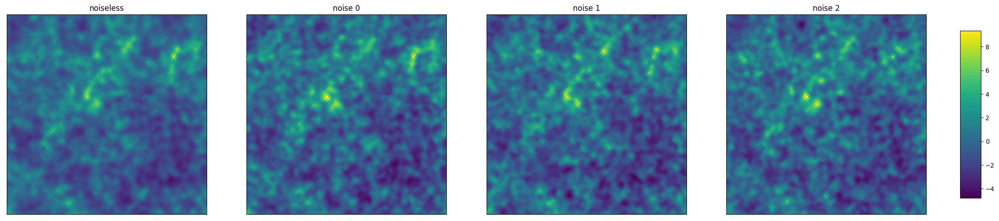

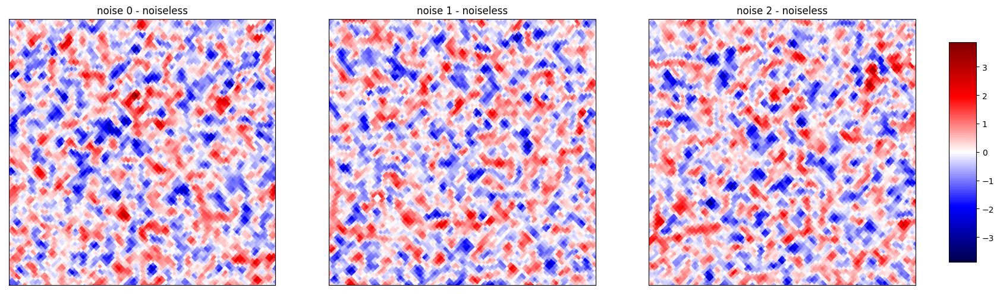

In [6]:
i_tomo = 7

# absolute maps
gnoms = []

hp_map = np.full(n_pix, hp.UNSEEN)
hp_map[noiseless_fid_pipe.data_vec_pix] = dv_noiseless[0,:,i_tomo]

# hp.mollview(hp_map, nest=True)
gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=1, xsize=600, ysize=600, return_projected_map=True, no_plot=True)
gnoms.append(gnom)

for dv_noisy in dvs_noisy:
    hp_map = np.full(n_pix, hp.UNSEEN)
    hp_map[noiseless_fid_pipe.data_vec_pix] = dv_noisy[0,:,i_tomo]
    
    # hp.mollview(hp_map, nest=True)
    gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=1, xsize=600, ysize=600, return_projected_map=True, no_plot=True)
    gnoms.append(gnom)
    
fig, ax = plt.subplots(figsize=(8*len(gnoms), 8), ncols=len(gnoms))

vmin = np.array(gnoms).min()
vmax = np.array(gnoms).max()

titles = ["noiseless", "noise 0", "noise 1", "noise 2"]

for i, gnom in enumerate(gnoms):
    im = ax[i].imshow(gnom, vmin=vmin, vmax=vmax)
    
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set(title=titles[i])
    
fig.colorbar(im, ax=ax, orientation="vertical", shrink=0.6, aspect=8, pad=0.03)

# difference to noiseless
gnoms = []

for dv_noisy in dvs_noisy:
    hp_map = np.full(n_pix, hp.UNSEEN)
    hp_map[noiseless_fid_pipe.data_vec_pix] = dv_noiseless[0,:,i_tomo] - dv_noisy[0,:,i_tomo]
    
    # hp.mollview(hp_map, nest=True)
    gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=1, xsize=600, ysize=600, return_projected_map=True, no_plot=True)
    gnoms.append(gnom)
    
fig, ax = plt.subplots(figsize=(8*len(gnoms), 8), ncols=len(gnoms))

vmin = - np.max([np.abs(np.array(gnoms).min()), np.abs(np.array(gnoms).max())])
vmax = np.max([np.abs(np.array(gnoms).min()), np.abs(np.array(gnoms).max())])

titles = ["noise 0 - noiseless", "noise 1 - noiseless", "noise 2 - noiseless"]

for i, gnom in enumerate(gnoms):
    im = ax[i].imshow(gnom, vmin=vmin, vmax=vmax, cmap="seismic")
    
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set(title=titles[i])

fig.colorbar(im, ax=ax, orientation="vertical", shrink=0.6, aspect=8, pad=0.03)

## fixed noise realization

In [7]:
# fix noise realization, shape (2*n_params+1, n_pix, n_z)
dv_noisy = dvs_noisy[0]
params = noiseless_fid_pipe.params
n_params = len(params)
n_maps = 2 * len(params) + 1 
data_vec_pix = noiseless_fid_pipe.data_vec_pix
n_z = noiseless_fid_pipe.n_z_metacal + noiseless_fid_pipe.n_z_maglim
n_z_metacal = noiseless_fid_pipe.n_z_metacal

reso = 600
gnoms = []
gnoms = np.zeros((n_maps, reso, reso, n_z))
for i_m in range(n_maps):
    for i_z in range(n_z):
        hp_map = np.full(n_pix, hp.UNSEEN)
        hp_map[data_vec_pix] = dv_noisy[i_m,:,i_z]

        gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=1, xsize=reso, ysize=reso, return_projected_map=True, no_plot=True)        
        gnoms[i_m,:,:,i_z] = gnom
        
gnoms = np.ma.masked_where(gnoms==0, gnoms)

### check derivatives

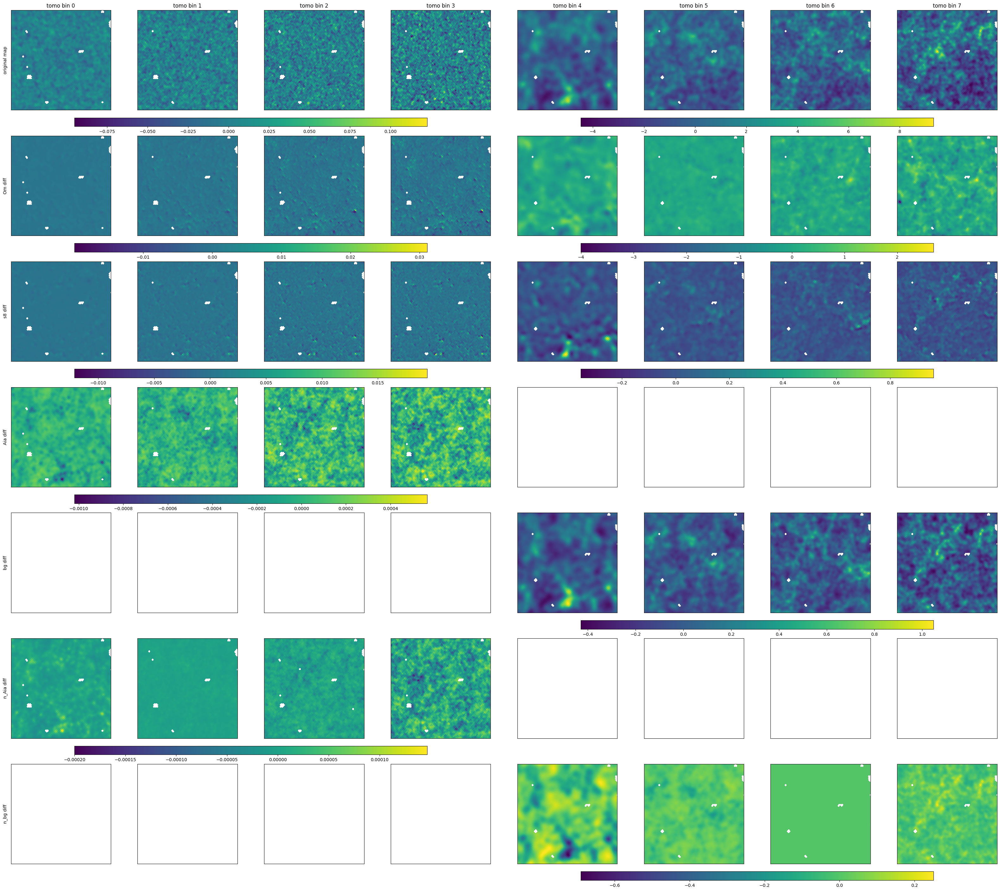

In [8]:
fig, ax = plt.subplots(figsize=(4*n_z, 4*(len(params)+1)), nrows=len(params)+1, ncols=n_z, constrained_layout=True) 

# original maps
for i_z in range(n_z):
    # lensing
    if i_z < n_z_metacal:
        vmin = gnoms[0,...,:n_z_metacal].min()
        vmax = gnoms[0,...,:n_z_metacal].max()

    # clustering
    else:
        vmin = gnoms[0,...,n_z_metacal:].min()
        vmax = gnoms[0,...,n_z_metacal:].max()

    im = ax[0,i_z].imshow(gnoms[0,...,i_z], vmin=vmin, vmax=vmax)
            
    if i_z == 0:
        fig.colorbar(im, ax=ax[0,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
    if i_z == 4:
        fig.colorbar(im, ax=ax[0,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)

    # cosmetics
    ax[0,i_z].set_xticks([])
    ax[0,i_z].set_yticks([])
    ax[0,i_z].set_aspect("equal")
    ax[0,i_z].set(title=f"tomo bin {i_z}")
    ax[0,0].set(ylabel="original map")

# perturbations
gnom_minus = gnoms[1::2]
gnom_plus = gnoms[2::2]

gnom_diff = gnom_plus - gnom_minus
gnom_diff = np.ma.masked_where(gnom_diff==0, gnom_diff)

wl_min = np.min(gnom_diff[...,:n_z_metacal], axis=(1,2,3))
wl_max = np.max(gnom_diff[...,:n_z_metacal], axis=(1,2,3))

gc_min = np.min(gnom_diff[...,n_z_metacal:], axis=(1,2,3))
gc_max = np.max(gnom_diff[...,n_z_metacal:], axis=(1,2,3))

for i_p, param in enumerate(params):
    for i_z in range(n_z):
        # lensing
        if i_z < n_z_metacal:
            vmin = wl_min[i_p]
            vmax = wl_max[i_p]

        # clustering
        else:
            vmin = gc_min[i_p]
            vmax = gc_max[i_p]
                        
        current_gnom = gnom_diff[i_p,...,i_z]
        im = ax[1+i_p,i_z].imshow(current_gnom, vmin=vmin, vmax=vmax)

        if not np.ma.count_masked(current_gnom) == reso**2:
            if i_z == 0:
                fig.colorbar(im, ax=ax[1+i_p,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
            if i_z == 4:
                fig.colorbar(im, ax=ax[1+i_p,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
               
        # cosmetics
        # if np.ma.count_masked(current_gnom) == reso**2:
        #     ax[1+i_p,i_z].axis("off")
        # else:
        #     ax[1+i_p,i_z].set_xticks([])
        #     ax[1+i_p,i_z].set_yticks([])

        ax[1+i_p,i_z].set_xticks([])
        ax[1+i_p,i_z].set_yticks([])
        ax[1+i_p,i_z].set_aspect("equal")
        ax[1+i_p,0].set(ylabel=param + " diff")

### check raw maps

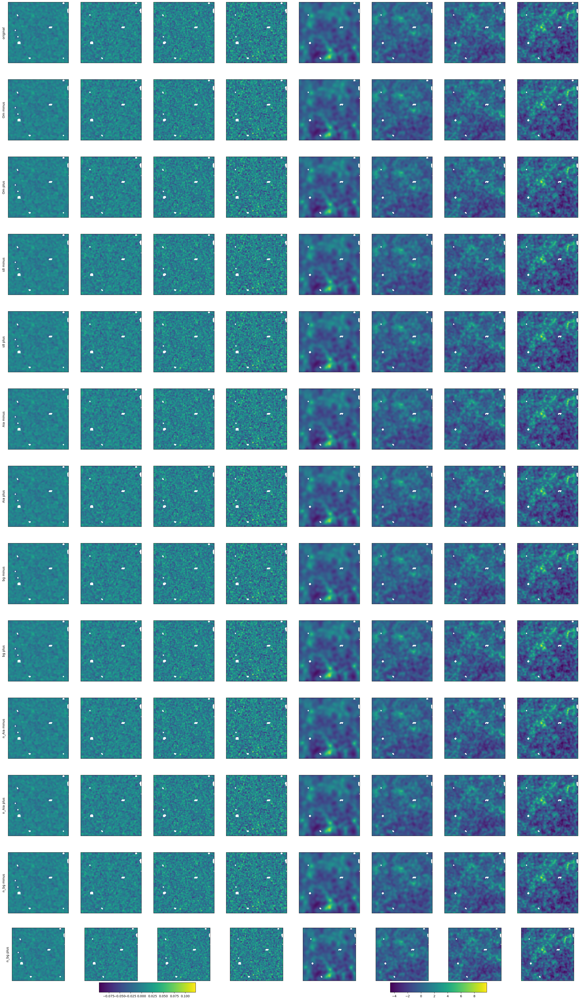

In [9]:
fig, ax = plt.subplots(figsize=(4*n_z, 4*(n_maps+1)), nrows=n_maps, ncols=n_z) 

wl_min = np.min(gnoms[...,:n_z_metacal])
wl_max = np.max(gnoms[...,:n_z_metacal])

gc_min = np.min(gnoms[...,n_z_metacal:])
gc_max = np.max(gnoms[...,n_z_metacal:])

for i_m in range(n_maps):
    if i_m == 0:
        param = "original"
        sign = ""
    else:
        param = params[(i_m - 1)//2]
        if i_m % 2 == 1:
            sign = "minus"
        else:
            sign = "plus"
                        
    for i_z in range(n_z):
        gnom = gnoms[i_m, :, :, i_z]
        
        # lensing
        if i_z < n_z_metacal:
            vmin = wl_min
            vmax = wl_max
        
        # clustering
        else:
            vmin = gc_min
            vmax = gc_max
            
        im = ax[i_m,i_z].imshow(gnom, vmin=vmin, vmax=vmax)
        # im = ax[i_m,i_z].imshow(gnom)

        # cosmetics
        ax[i_m,i_z].set_xticks([])
        ax[i_m,i_z].set_yticks([])
        ax[i_m,i_z].set_aspect("equal")
        ax[i_m,0].set(ylabel=param + " " + sign)

        if i_m == n_maps - 1 and (i_z == 0 or i_z == 4):
            if i_z < n_z_metacal:
                fig.colorbar(im, ax=ax[i_m,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=10, pad=0.03)
            else:
                fig.colorbar(im, ax=ax[i_m,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=10, pad=0.03)
